# Project: Trigger Word Detection
**Author: Yaroslav Morozevych**

Dependencies:
- `src/audio_utils.py`
- `src/audio_processing.py`
- `src/predictions.py`
- `src/plots.py`

Data:
- `./data/raw_data`
- `./data/XY_dev`
- `./data/XY_train`
- `./data/XY_test`

### Import all required libraries:

In [2]:
# Import Keras and Tensorflow for the Deep Learning Model.
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow

# Import own modules.
from src.audio_processing import *
from src.audio_utils import *
from src.predictions import *
from src.plots import *

# Import audio data-related libs.
from pydub import AudioSegment
import librosa

# Import signal prossesing libs.
from scipy import signal as sig
from scipy import fftpack

# Standard import.
import io
import os
import sys
import glob
import random
import IPython
import numpy as np

%matplotlib inline

# I. Observe Data Samples

In this project we are working with audio samples that are used to train the CNN model. This model has to be able to identify the "activate" word (trigger) and add a ding sound after the trigger word to the original audio. The same as Apple has done with Siri or Google with Google Assistant.

In [3]:
# Play the original signal.
sample = "audio_examples/example_train.wav"
IPython.display.Audio(sample)

In [4]:
# Extract data from the original signal.
sample_rate, signal = wavfile.read(sample)
signal = [sig[0] for sig in signal]

### Time & Frequency Domains

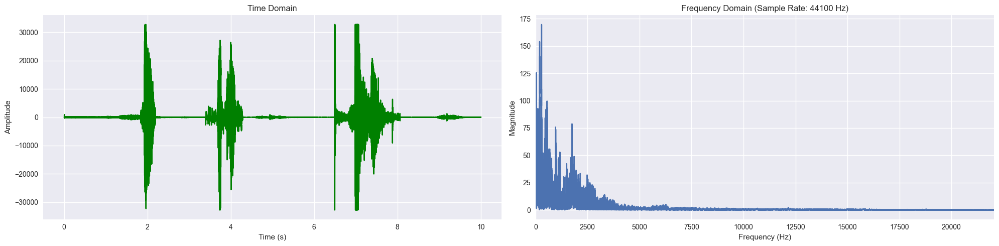

In [28]:
plot_sample_domains(signal, sample_rate)

Even though the Time and Frequency Domains both contain the information we need, we can't use them as the inputs for our model because of their huge size. However, not only the size is the case here, but also we would love to have the relation between the Frequency and Time. Thus, we could use the spectrogram instead.

### Spectrogram
> A spectrogram displays the strength of a signal over time at a waveform’s various frequencies.

In our case, the shape of our audio clip is too big for our RNN model. Thus, we would love to reduce the shape of our frequency domain to increase the performance of our model. 

The dimension of the output spectrogram depends upon the hyperparameters of the spectrogram software and the length of the input. As we are working with only 10 second audio clips for our training samples, we can define the static hyperparameters for our spectrogram, resulting in the number of timesteps to be 5511.

**Hyperparameters chosen for the spectrogram:**

[`matplotlib.pyplot.specgram`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.specgram.html)
- `nfft = 200` - Length of each window segment
- `fs = 8000` - Sampling frequencies
- `noverlap = 120` - Overlap between windows

So what we have as a result is a spectrogram that is computed by sliding a window over the raw audio signal, with the most active frequencies calculated in each window using a Fourier transform.

To sum up, as the input our model will take the power spectrum of the spectrogram. However, this is not the only parameter that will be passed. Another one will be covered in the following section.

<img src="images/spectr_to_nn.png" style="width:500px;height:300px;">

The way our CNN/RNN works is pretty similar to the one that is on the image, however we feed in not a single slice, but the whole power spectrum along with its labeled instance (will be covered further). And what we receive as an output is a likelihood of saying "Activate", but not the likelohood of saying a specific character.

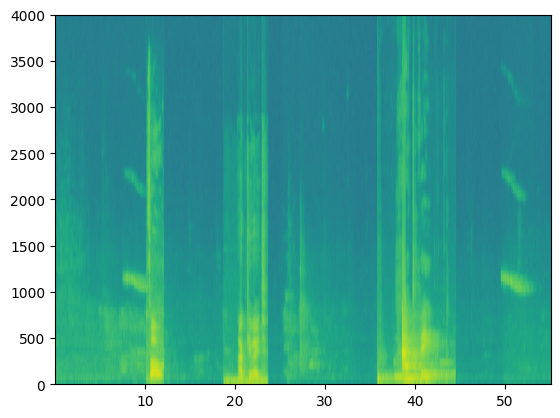

In [7]:
power_spectrum = get_shrinked_spectrogram(sample)

### Compare Shapes
Even that we reduced the dimentions of the data we are working with, we can still see the similarities between our output spectrogram and time & frequency domains of the input signal.

In [8]:
print(f"Time steps in the input sample: {len(signal),}")
print(f"Time steps in the output power spectrum: {power_spectrum.shape}")

Time steps in the input sample: (441000,)
Time steps in the output power spectrum: (101, 5511)


Now that we see the shapes, we can define some constants that will be the inputs and outputs for our future CNN/RNN model.

In [9]:
Tx = 5511           # The number of time steps input to the model from the spectrogram
Ty = 1375           # The number of time steps in the output of our model (produced by GRU)
n_freq = 101        # Number of frequencies input to the model at each time step of the spectrogram
duration_ms = 10000 # Static duration of audio in milliseconds

# II. Generating Train Dataset
This approach I borrowed from [DeepLearning.ai](https://www.deeplearning.ai/) Course.

Because speech data is hard to acquire and label, we will synthesize our training data using the audio clips of activates, negatives, and backgrounds. It is quite slow to record lots of 10 second audio clips with random "activates" in it. Instead, it is easier to record lots of positives and negative words, and record background noise separately (or download background noise from free online sources).

To synthesize a single training example, we will:

- Pick a random 10 second background audio clip
- Randomly insert 0-4 audio clips of "activate" into this 10sec clip
- Randomly insert 0-2 audio clips of negative words into this 10sec clip

In our case, the activates are "activate" sounds and the other sounds are refered to as negatives.

Here, we will use the [`pydub`](http://pydub.com/) package to manipulate audio. Pydub converts raw audio files into lists of Pydub data structures. It uses 1ms as the discretization interval which is why a 10sec clip is always represented using 10,000 steps.

In [10]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()

print(f"background len: {len(backgrounds[0])}")
print(f"activate[0] len: {len(activates[0])}")
print(f"activate[1] len: {len(activates[1])}")

background len: 10000
activate[0] len: 1741
activate[1] len: 731


### Overlaying the pronounced words onto the background:
Now, we will be inserting multiple clips of positive/negative words onto the background. So, we need to take care that the words we have added previously do not intersect with each other.

### Creating the labels for the overlayed words:
Also, the labels $y_t$ represent whether or not someone has just finished saying "activate." Given a background clip, we can initialize $y_t = 0$ for all $t$ , since the clip doesn't contain any "activates."

When we insert or overlay an "activate" clip, we will also update labels for $y_t$ to be equal to 1. We will train a GRU to detect when someone has finished saying "activate". For example, suppose the synthesized "activate" clip ends at the 5sec mark in the 10sec audio. Recall that $T_y = 1375$ , so timestep  `int(1375*0.5) = 687` corresponds to the moment at 5sec into the audio. So, we will set $y_{688} = 1$. Further, we will be quite satisfied if the GRU detects "activate" anywhere within a short time-internal after this moment, so we actually set 50 consecutive values of the label $y_t$ to 1, resulting in $y_{688} = y_{689} = ... = y_{737} = 1$.

<img src="images/label_diagram.png" style="width:500px;height:200px;">

Here's a figure illustrating the labels $y_t$, for a clip which we have inserted "activate", "innocent", activate", "baby." Note that the positive labels "1" are associated only with the positive words. 

### Observe how it works:

Segment Time: (198, 298)


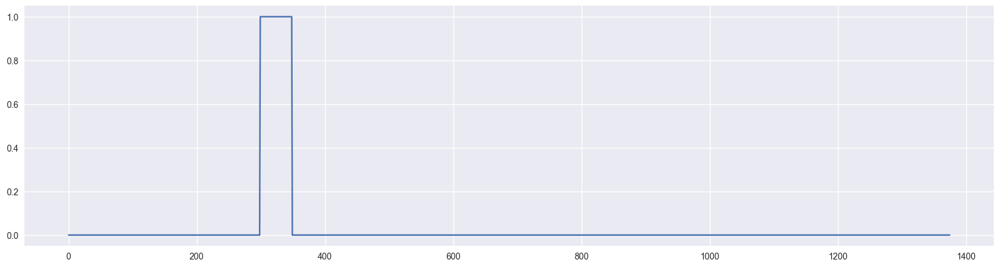

In [12]:
# Get some test data.
background = backgrounds[0]
random_activate = activates[1]
previous_segments = [(5555, 7000)]

# Overlay some audio clip onto the background.
background, segment_time = insert_audio_clip(background, random_activate, previous_segments)

# Save audio.
background.export("./outputs/insert_test.wav", format="wav")

# Retrieve segment_start and segment_end from segment_time
segment_start, segment_end = segment_time
print(f"Segment Time: ({segment_start * Ty // duration_ms}, {segment_end * Ty // duration_ms})")

# Insert labels in "y" (y = 1)
y = insert_ones(np.zeros((1, Ty)), segment_end_ms=segment_end)

# Plot the labeled area.
plt.style.use("seaborn")
plt.rcParams["figure.figsize"] = (20,5)
plt.plot(range(0, Ty), y[0])
plt.show()

In [13]:
# Play the overlayed audio.
IPython.display.Audio("./outputs/insert_test.wav")

### Conclusion

In `audio_processing.py` file, there is a function `create_training_example()` that takes care of creating the dataset as we did above. As an output, it returns two arrays, 
- **x** - power spectrum of a signal. 
- **y** - labeled array.

This way we created the train and test datasets. But for the sake of simplicity, we don't do that in the main notebook. However, you can look at how it is done at `src/audio_processing.py` file.

# III. Load Train & Test Datasets 

In [14]:
# Load preprocessed training examples
X = np.load("./data/XY_train/X.npy")
Y = np.load("./data/XY_train/Y.npy")

In [15]:
# Load preprocessed dev set examples
X_dev = np.load("./data/XY_dev/X_dev.npy")
Y_dev = np.load("./data/XY_dev/Y_dev.npy")

# IV. Define the Model
The architecture for our RNN consists of 4 main types of layers:
- **Convolution**: Basic convolutional layer.
- **BatchNorm**: This layer is used to normalize the activations from each previous layer so that the gradient descent could converge better during training.
- **Dropout**: This layer allows us to increase our model performance by dropping out some of the neurons from each of our layer block.
- **GRU**: To solve the vanishing gradient problem of a standard RNN, GRU uses, so-called, update gate and reset gate. Basically, these are two vectors which decide what information should be passed to the output.

In [16]:
class TriNet:
    """
    Class for Keras RNN model initialization.
    """
    def __init__(self, input_shape):
        """
        Initialize model params.
        
        :param input_shape: np.array - shape of the model's input data.
        """
        self.shape = input_shape
    
    def model(self):
        """
        Create CNN model's graph with Keras

        :return: model - Keras model instance.
        """
        X_input = Input(shape = self.shape)

        # Layer 1: CONV layer
        X = Conv1D(196, kernel_size=15, strides=4)(X_input) # the number of output filters is 196.
        X = BatchNormalization()(X)                           
        X = Activation('relu')(X) 
        X = Dropout(0.8)(X)      

        # Layer 2: First GRU Layer
        X = GRU(units = 128, return_sequences = True, reset_after=True)(X)
        X = Dropout(0.8)(X)
        X = BatchNormalization()(X)

        # Layer 3: Second GRU Layer
        X = GRU(units = 128, return_sequences = True, reset_after=True)(X)
        X = Dropout(0.8)(X) 
        X = BatchNormalization()(X)
        X = Dropout(0.8)(X)

        # Layer 4: Time-distributed sigmoid dense layer
        X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)

        return Model(inputs = X_input, outputs = X)

In [17]:
model = TriNet(input_shape = (Tx, n_freq)).model()

In [18]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d (Conv1D)              (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization (BatchNo (None, 1375, 196)         784       
_________________________________________________________________
activation (Activation)      (None, 1375, 196)         0         
_________________________________________________________________
dropout (Dropout)            (None, 1375, 196)         0         
_________________________________________________________________
gru (GRU)                    (None, 1375, 128)         125184    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1375, 128)         0     

# V. Fit & Train Model

Trigger word detection model takes too long to train. In my case, it took 6 hours and 53 minutes to train on the full dataset. That is why, I decided to train the model on my another computer with graphics card GTX 960M, which took me only 2.5 hours. Regarding that I had to choose model's regularization parameters, it was easier for me to choose those parameters while training the model on GPU and then save the already pretrained model.

Now we will load that pretrained model will continue working with it.

In [19]:
tensorflow.compat.v1.disable_v2_behavior()
model = tensorflow.compat.v1.keras.models.load_model('./models/tr_model.h5')

Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Colocations handled automatically by placer.


In [20]:
from keras import backend as K


def precision_metric(y_true, y_pred):
    """
    Find the relation between true positives and predicted positives.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

In [21]:
# Load optimizer with predefined regularization parameters.
optimizer = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
# Here we prefer precision to accuracy score, because the more frequently our model evaluates "activate" word,
# the better it is for user.
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=["acc", precision_metric])

In [22]:
# Fit a small train dataset in addition.
model.fit(X, Y, batch_size = 5, epochs=1)

Train on 26 samples
26/26 [==============================] - 11s 423ms/sample - loss: 0.0723 - acc: 0.9776 - precision_metric: 0.7102


# VI. Model Evaluation 

In [24]:
loss, acc, precision = model.evaluate(X_dev, Y_dev)
print(f"Accuracy: {acc}, Loss: {loss}, Precision: {precision}")

Accuracy: 0.9452218413352966, Loss: 0.3700175881385803, Precision: 0.926916241645813


# VII. Model Testing

In [25]:
test_filename = "./data/raw_data/dev/2.wav"
IPython.display.Audio(test_filename)

Now, each time after we hear word "Activate" we will add a "Ding" sound to denote that the model percives the word as a trigger word.

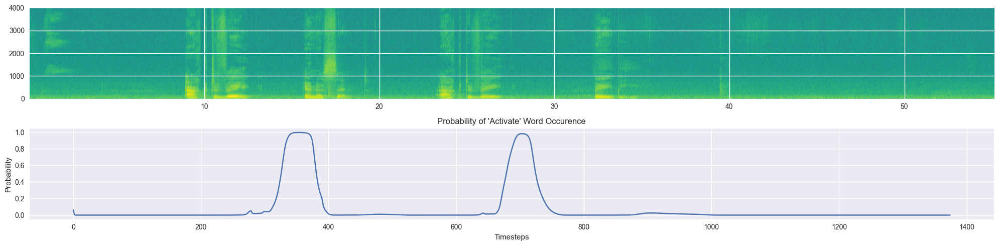

In [29]:
prediction = predict_triggerword(model, test_filename)
ding_on_activate(test_filename, prediction, 0.5)
IPython.display.Audio("./outputs/ding_output.wav")

# VIII. Conclusions
As we can see and hear, our model can predict when someone pronounces word "Activate". However, regarding that our dataset is not as great as we would like it to be as well as the model itself, the scores that the model shows aren't high either. Nevertheless, the aim of this project was not to build a great model, but rather to understand how we can work with sound in order to resolve tasts that require speech recognition.

One part of this project was also to test if we can use filters for noise filtering in order to help our model receive higher scores. In theory, it could help, but on practice (at least in my case) I received even less scores, because sometimes filteres were distorting the original sound. Also, the NN model is smart enough to recognize noises when trained with proper dataset, so maybe there is no need for filters, or if there is, they should be pretty complex to filter the noises properly and not distort the original sound.

**Best Results (Without Noise Filters)**:
- Accuracy: **0.945**
- Loss: **0.368**
- Precision: **0.926**

**Best Results (With Noise Filters)**:
- Accuracy: **0.827**
- Loss: **0.484**
- Precision: **0.816**